In [115]:
pwd

'C:\\Users\\jibra\\Downloads\\cmder'

In [116]:
#set up working environment
import numpy as np
import pandas as pd
import geopandas as gpd
import pandana as pnda
from pandana.loaders import osm
import osmnx as ox
import altair as alt
import time
from shapely.geometry import Point
alt.renderers.enable('notebook')
%matplotlib inline

In [117]:
#import files to be used
zillowSHP = gpd.read_file("zillowdata/ZillowNeighborhoods-NY.shp") #NYC neighborhoods shpfile
rentalsData = pd.read_csv("Neighborhood_Zri_MultifamilyResidenceRental.csv") # rentals data
walkscore = pd.read_csv("Walkscore.csv") #Walkscore data

In [25]:
def amenityMap(zillowSHP, neighborhood, amenity, m):
    neighborhoodSHP = zillowSHP[zillowSHP["County"].isin([neighborhood])].geometry.unary_union
    neighborhood_boundary = neighborhoodSHP.bounds
    [lng_min, lat_min, lng_max, lat_max] = neighborhood_boundary
    poi_df = osm.node_query(lat_min, lng_min, lat_max, lng_max, tags="amenity=cafe")
    poi_df = poi_df.dropna(subset=['amenity'])
    poi_df = poi_df[poi_df['amenity'].isin([amenity])]
    net = osm.pdna_network_from_bbox(lat_min, lng_min, lat_max, lng_max, network_type='walk')
    
    max_distance = 10000
    num_pois = 5
    
    #for amenity in amenities:
    #    pois_subset = poi_df[poi_df['amenity']==amenity] 
    #    net.set_pois(amenity, max_distance, num_pois, pois_subset['lon'], pois_subset['lat'])
 
    bbox_aspect_ratio = (lat_max - lat_min) / (lng_max - lng_min)
    fig_kwargs = {'facecolor':'w', 
              'figsize':(10, 10 * bbox_aspect_ratio)}
    plot_kwargs = {'s':20, 
               'alpha':0.9, 
               'cmap':'viridis_r', 
               'edgecolor':'none'}

    def to_geopandas(df, xcol='x', ycol='y'):
        df['geometry'] = df.apply(lambda row: Point(row[xcol], row[ycol]), axis=1)
        return gpd.GeoDataFrame(df, geometry='geometry', crs={'init':'epsg:4326'})
    
    def plot_walking_distance(net, amenity2, distance=10000, n=m):

        # subset of POI
        poi_subset = poi_df[poi_df['amenity']==amenity2]
        net.set_pois(amenity, max_distance, num_pois, poi_subset['lon'], poi_subset['lat'])
        
        # get the distances to nearest num_pois POI
        access = net.nearest_pois(distance=1000, category=amenity, num_pois=num_pois)

        # merge node positions and distances to nearest PO
        nodes = pd.merge(net.nodes_df, access, left_index=True, right_index=True)    
        nodes = to_geopandas(nodes)

        # plot the distance to the nth nearest amenity
        ax = nodes.plot(column=nodes[n], legend=True, **plot_kwargs)

        # add the amenities as stars
        for i, row in poi_subset.iterrows():
            ax.scatter(row['lon'], row['lat'], color='red', s=100, marker='*')

        # format
        ax.set_facecolor('black')
        ax.figure.set_size_inches(fig_kwargs['figsize'])

        # set extent
        [xmin, ymin, xmax, ymax] = nodes.geometry.total_bounds
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        
        access_valid = access[access[1]<9999]
        meanaccess = access_valid[1].mean()
        print('Mean distance to {} in meters = {}'.format(amenity,meanaccess))
        
        return ax
    
    ax = plot_walking_distance(net, amenity)
    ax.set_facecolor('k')
    ax.set_title('Walking distance to nearest {} in {} County'.format(amenity, neighborhood), fontsize=18);

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56994268,-74.04277732,40.73946406,-73.83352689);>;);out;'}"
Downloaded 20,024.2KB from www.overpass-api.de in 6.70 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 7.07 seconds
Returning OSM data with 105,367 nodes and 31,784 ways...
Edge node pairs completed. Took 51.42 seconds
Returning processed graph with 42,936 nodes and 67,932 edges...
Completed OSM data download and Pandana node and edge table creation in 60.32 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Mean distance to cafe in meters = 633.7889680110914


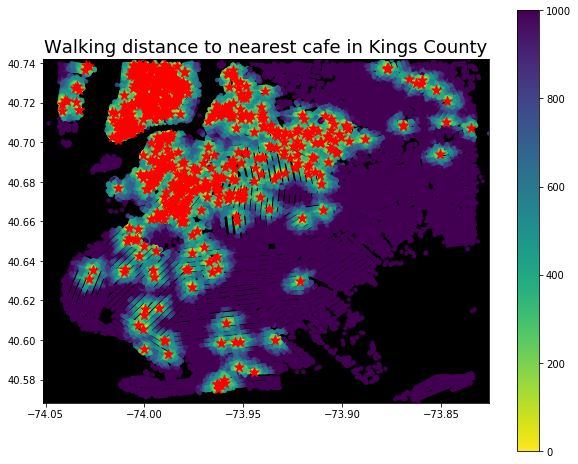

In [26]:
amenityMap(zillowSHP, "Kings", "cafe", 1)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.54082268,-73.96353131,40.80160932,-73.70027200);>;);out;'}"
Downloaded 35,318.5KB from www.overpass-api.de in 22.91 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 23.61 seconds
Returning OSM data with 190,356 nodes and 55,033 ways...
Edge node pairs completed. Took 90.93 seconds
Returning processed graph with 75,117 nodes and 116,524 edges...
Completed OSM data download and Pandana node and edge table creation in 117.80 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Mean distance to cafe in meters = 790.9017539430597


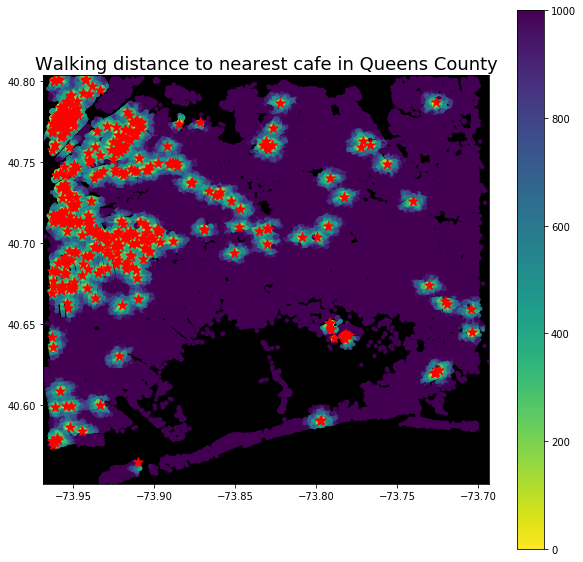

In [27]:
amenityMap(zillowSHP, "Queens", "cafe", 1)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.68303568,-74.04728500,40.87914429,-73.90712222);>;);out;'}"
Downloaded 25,037.2KB from www.overpass-api.de in 10.02 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 10.61 seconds
Returning OSM data with 139,486 nodes and 36,691 ways...
Edge node pairs completed. Took 67.33 seconds
Returning processed graph with 48,171 nodes and 75,128 edges...
Completed OSM data download and Pandana node and edge table creation in 80.57 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Mean distance to cafe in meters = 514.1100600698509


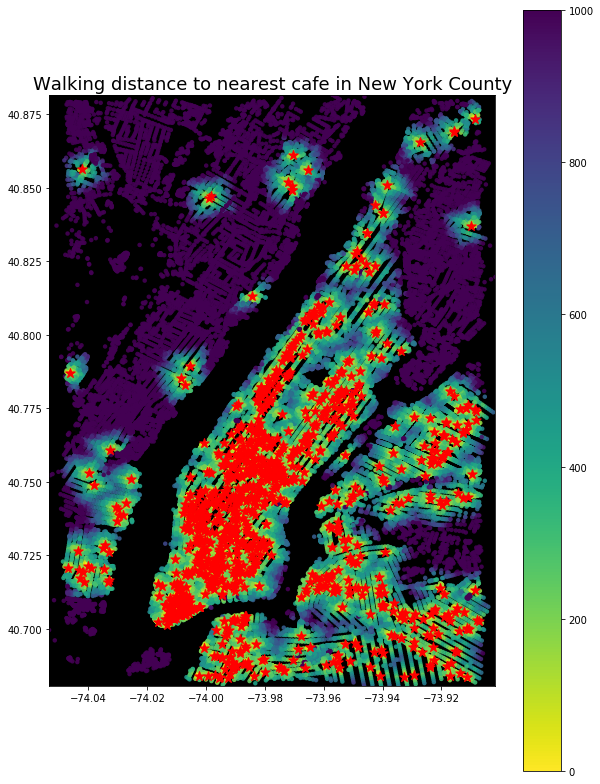

In [28]:
amenityMap(zillowSHP, "New York", "cafe", 1)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.78446609,-73.93434893,40.91577113,-73.76437232);>;);out;'}"
Downloaded 12,446.1KB from www.overpass-api.de in 5.23 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 5.49 seconds
Returning OSM data with 76,532 nodes and 16,115 ways...
Edge node pairs completed. Took 27.60 seconds
Returning processed graph with 21,376 nodes and 31,931 edges...
Completed OSM data download and Pandana node and edge table creation in 34.36 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Mean distance to cafe in meters = 912.6624925407375


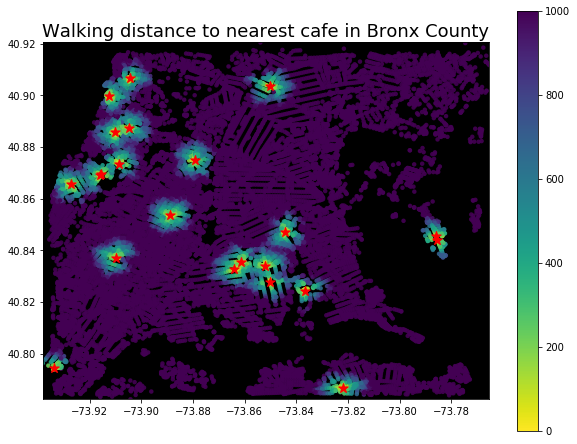

In [32]:
amenityMap(zillowSHP, "Bronx", "cafe", 1)

In [33]:
def amenityMap(zillowSHP, neighborhood, amenity, m):
    neighborhoodSHP = zillowSHP[zillowSHP["County"].isin([neighborhood])].geometry.unary_union
    neighborhood_boundary = neighborhoodSHP.bounds
    [lng_min, lat_min, lng_max, lat_max] = neighborhood_boundary
    poi_df = osm.node_query(lat_min, lng_min, lat_max, lng_max, tags="amenity=school")
    poi_df = poi_df.dropna(subset=['amenity'])
    poi_df = poi_df[poi_df['amenity'].isin([amenity])]
    net = osm.pdna_network_from_bbox(lat_min, lng_min, lat_max, lng_max, network_type='walk')
    
    max_distance = 10000
    num_pois = 5
    
    #for amenity in amenities:
    #    pois_subset = poi_df[poi_df['amenity']==amenity] 
    #    net.set_pois(amenity, max_distance, num_pois, pois_subset['lon'], pois_subset['lat'])
 
    bbox_aspect_ratio = (lat_max - lat_min) / (lng_max - lng_min)
    fig_kwargs = {'facecolor':'w', 
              'figsize':(10, 10 * bbox_aspect_ratio)}
    plot_kwargs = {'s':20, 
               'alpha':0.9, 
               'cmap':'viridis_r', 
               'edgecolor':'none'}

    def to_geopandas(df, xcol='x', ycol='y'):
        df['geometry'] = df.apply(lambda row: Point(row[xcol], row[ycol]), axis=1)
        return gpd.GeoDataFrame(df, geometry='geometry', crs={'init':'epsg:4326'})
    
    def plot_walking_distance(net, amenity2, distance=10000, n=m):

        # subset of POI
        poi_subset = poi_df[poi_df['amenity']==amenity2]
        net.set_pois(amenity, max_distance, num_pois, poi_subset['lon'], poi_subset['lat'])
        
        # get the distances to nearest num_pois POI
        access = net.nearest_pois(distance=1000, category=amenity, num_pois=num_pois)

        # merge node positions and distances to nearest PO
        nodes = pd.merge(net.nodes_df, access, left_index=True, right_index=True)    
        nodes = to_geopandas(nodes)

        # plot the distance to the nth nearest amenity
        ax = nodes.plot(column=nodes[n], legend=True, **plot_kwargs)

        # add the amenities as stars
        for i, row in poi_subset.iterrows():
            ax.scatter(row['lon'], row['lat'], color='red', s=100, marker='*')

        # format
        ax.set_facecolor('black')
        ax.figure.set_size_inches(fig_kwargs['figsize'])

        # set extent
        [xmin, ymin, xmax, ymax] = nodes.geometry.total_bounds
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        
        access_valid = access[access[1]<9999]
        meanaccess = access_valid[1].mean()
        print('Mean distance to {} in meters = {}'.format(amenity,meanaccess))
        
        return ax
    
    ax = plot_walking_distance(net, amenity)
    ax.set_facecolor('k')
    ax.set_title('Walking distance to nearest {} in {} County'.format(amenity, neighborhood), fontsize=18);

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56994268,-74.04277732,40.73946406,-73.83352689);>;);out;'}"
Downloaded 20,024.2KB from www.overpass-api.de in 14.51 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 14.88 seconds
Returning OSM data with 105,367 nodes and 31,784 ways...
Edge node pairs completed. Took 49.01 seconds
Returning processed graph with 42,936 nodes and 67,932 edges...
Completed OSM data download and Pandana node and edge table creation in 65.75 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Mean distance to school in meters = 647.1405847760936


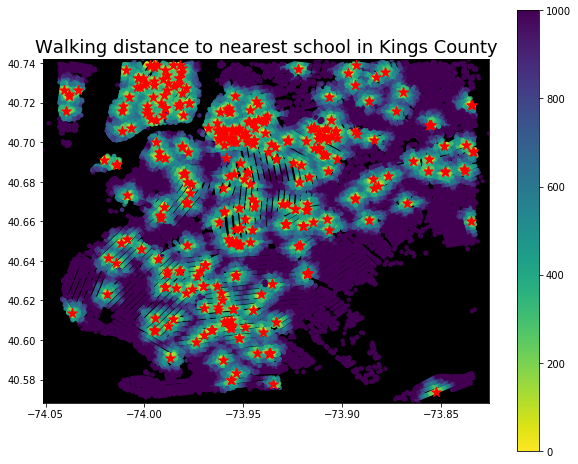

In [34]:
amenityMap(zillowSHP, "Kings", "school", 1)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.54082268,-73.96353131,40.80160932,-73.70027200);>;);out;'}"
Downloaded 35,318.5KB from www.overpass-api.de in 20.14 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 20.89 seconds
Returning OSM data with 190,356 nodes and 55,033 ways...
Edge node pairs completed. Took 86.16 seconds
Returning processed graph with 75,117 nodes and 116,524 edges...
Completed OSM data download and Pandana node and edge table creation in 110.39 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Mean distance to school in meters = 719.1066772390234


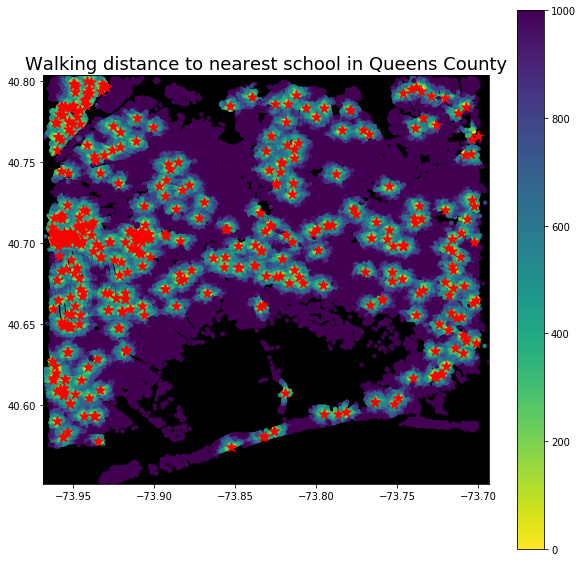

In [35]:
amenityMap(zillowSHP, "Queens", "school", 1)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.68303568,-74.04728500,40.87914429,-73.90712222);>;);out;'}"
Downloaded 25,037.2KB from www.overpass-api.de in 7.74 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 8.27 seconds
Returning OSM data with 139,486 nodes and 36,691 ways...
Edge node pairs completed. Took 58.70 seconds
Returning processed graph with 48,171 nodes and 75,128 edges...
Completed OSM data download and Pandana node and edge table creation in 69.24 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Mean distance to school in meters = 566.4790172240171


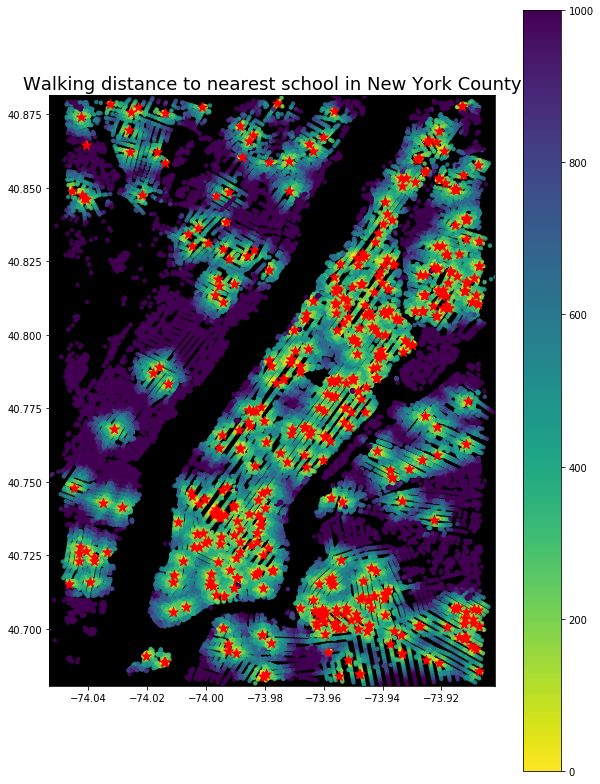

In [36]:
amenityMap(zillowSHP, "New York", "school", 1)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.78446609,-73.93434893,40.91577113,-73.76437232);>;);out;'}"
Downloaded 12,446.1KB from www.overpass-api.de in 5.17 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 5.37 seconds
Returning OSM data with 76,532 nodes and 16,115 ways...
Edge node pairs completed. Took 46.40 seconds
Returning processed graph with 21,376 nodes and 31,931 edges...
Completed OSM data download and Pandana node and edge table creation in 53.06 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Mean distance to school in meters = 608.917354211702


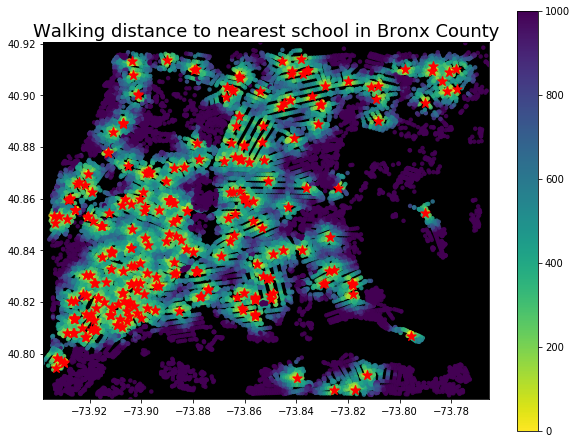

In [37]:
amenityMap(zillowSHP, "Bronx", "school", 1)

In [39]:
#wrangle the rentals data
rentalsNYC = rentalsData['CountyName'].isin(['New York County', 'Queens County', 'Kings County', 'Bronx County', 'Brooklyn County'])
rentalsNYC = rentalsData.loc[rentalsNYC]
rentalsNYC.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2010-11,2010-12,2011-01,...,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12,2019-01,2019-02,2019-03
3,270958,Upper West Side,New York,NY,New York-Newark-Jersey City,New York County,4,3426.0,3407.0,3368.0,...,3646,3626,3619,3618,3637,3710,3815,3910,3946,3948
5,270957,Upper East Side,New York,NY,New York-Newark-Jersey City,New York County,6,3110.0,3101.0,3057.0,...,3435,3432,3434,3434,3440,3455,3486,3516,3524,3502
9,194430,East New York,New York,NY,New York-Newark-Jersey City,Kings County,10,1500.0,1500.0,1502.0,...,2175,2172,2170,2169,2173,2192,2216,2235,2239,2239
11,198687,Washington Heights,New York,NY,New York-Newark-Jersey City,New York County,12,2222.0,2229.0,2208.0,...,2483,2472,2464,2460,2464,2494,2525,2551,2542,2519
14,272816,Astoria,New York,NY,New York-Newark-Jersey City,Queens County,15,1697.0,1688.0,1678.0,...,2232,2230,2231,2232,2232,2236,2240,2243,2240,2235


In [40]:
walkscore.head()

,Rank,Name,Walk Score,Transit Score,Bike Score,Population
0,1,Little Italy,100,100,95,"3,749"
1,2,NoHo,100,100,94,"3,123"
2,3,NoLita,100,100,94,"6,464"
3,4,Bowery,100,100,96,"16,702"
4,5,Union Square,100,100,91,"7,810"


In [56]:
resultsRentWalk = pd.merge(rentalsNYC, walkscore, left_on ="RegionName", right_on="Name")
resultsRentWalk.head(50)

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2010-11,2010-12,2011-01,...,2018-12,2019-01,2019-02,2019-03,Rank,Name,Walk Score,Transit Score,Bike Score,Population
0,270958,Upper West Side,New York,NY,New York-Newark-Jersey City,New York County,4,3426.0,3407.0,3368.0,...,3815,3910,3946,3948,29,Upper West Side,98,99,80,"208,776"
1,270957,Upper East Side,New York,NY,New York-Newark-Jersey City,New York County,6,3110.0,3101.0,3057.0,...,3486,3516,3524,3502,22,Upper East Side,99,99,77,"208,013"
2,194430,East New York,New York,NY,New York-Newark-Jersey City,Kings County,10,1500.0,1500.0,1502.0,...,2216,2235,2239,2239,127,East New York,86,88,66,"142,173"
3,198687,Washington Heights,New York,NY,New York-Newark-Jersey City,New York County,12,2222.0,2229.0,2208.0,...,2525,2551,2542,2519,41,Washington Heights,97,97,71,"158,951"
4,272816,Astoria,New York,NY,New York-Newark-Jersey City,Queens County,15,1697.0,1688.0,1678.0,...,2240,2243,2240,2235,84,Astoria,92,78,74,"153,924"
5,199001,Williamsburg,New York,NY,New York-Newark-Jersey City,Kings County,18,2256.0,2208.0,2128.0,...,2779,2794,2793,2805,44,Williamsburg,96,89,82,"138,526"
6,194737,Flatbush,New York,NY,New York-Newark-Jersey City,Kings County,21,1636.0,1594.0,1563.0,...,2189,2201,2198,2183,71,Flatbush,94,92,75,"167,618"
7,403222,Crown Heights,New York,NY,New York-Newark-Jersey City,Kings County,24,1569.0,1550.0,1539.0,...,2390,2406,2411,2411,59,Crown Heights,95,98,82,"125,818"
8,25294,Jamaica,New York,NY,New York-Newark-Jersey City,Queens County,25,1632.0,1619.0,1610.0,...,2198,2232,2238,2238,116,Jamaica,88,94,53,"89,810"
9,343222,Williamsbridge,New York,NY,New York-Newark-Jersey City,Bronx County,30,1513.0,1547.0,1585.0,...,1879,1901,1913,1920,123,Williamsbridge,87,80,70,"31,788"


In [112]:
#build a scatterplot comparing rent prices to walkscore for each NYC neighborhood, shaded by Borough
import seaborn as sns
import altair as alt

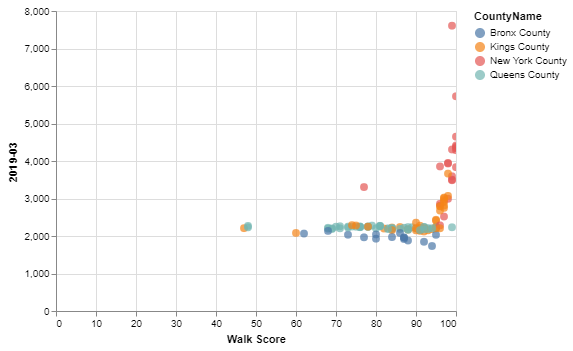

In [119]:
# initialize the chart with the data
chart = alt.Chart(resultsRentWalk)

# define what kind of marks to use
chart = chart.mark_circle(size=60)

# encode the visual channels
chart = chart.encode(
    x='Walk Score',
    y='2019-03',
    color='CountyName',
    tooltip=['RegionName', "Walk Score", "2019-03", 'CountyName']
)

# make the chart interactive
chart.interactive()

In [80]:
boroughs = gpd.read_file("./Borough Boundaries.geojson").to_crs(epsg=4326).query("boro_name != 'Staten Island'")
[lng_min, lat_min, lng_max, lat_max] = boroughs.unary_union.bounds

amenity = 'cafe'

In [88]:
# trying to define a function that loops over each neighborhood in NYC and calculates the mean distance to a given 
# amenity type and adds the neighborhood name and mean to a dataframe which we can print out at the end.

# Some errors / questions for Nick - 
### doesn't work if there isn't that type of amenity in one of the neighborhoods
### how to think about doing this for more than one amenity at a time
### what does max distance mean? / currently filtering it out

def getMeanAccess(zillowSHP, amenities):
    
    meandf = []
    NYCzillowSHP = zillowSHP[zillowSHP["County"].isin(["Queens","Manhattan", "Kings", "Bronx"])]
    neighborhoodlist = NYCzillowSHP["Name"].tolist()
    
    for hood_name in neighborhoodlist[:5]:
        hood = zillowSHP['Name'].isin([hood_name])
        zillowhood = zillowSHP.loc[hood]
        boundaryhood = zillowhood.geometry.unary_union
        hoodbounds = boundaryhood.bounds
        [lng_min, lat_min, lng_max, lat_max] = hoodbounds
        poi_dfhood = osm.node_query(lat_min, lng_min, lat_max, lng_max)
        poi_dfhood = poi_dfhood.dropna(subset=['amenity'])
        
        time.sleep(5)
        net = osm.pdna_network_from_bbox(lat_min, lng_min, lat_max, lng_max, 
                                 network_type='walk')
        max_distance = 50000 # in meters
        num_pois = 10 # only need the 10 nearest POI to each point in the network
        
        for amenity in amenities:
    
            # query OSM to get only this type of amenity
            tag ="'amenity' ='bar'"
            try:    
                pois_subset = osm.node_query(lat_min, lng_min, lat_max, lng_max, tags=tag)
            except:
                continue
        
        
        #get the subset of amenities for this type
           # pois_subset = poi_dfhood[poi_dfhood['amenity']==amenity]
            
            if pois_subset.shape[0]>0:
            
                # set the POI, using the longitude and latitude of POI
                net.set_pois(amenity, max_distance, num_pois, pois_subset['lon'], pois_subset['lat'])
        
                access = net.nearest_pois(distance=50000, category=amenity, num_pois=num_pois)
                access_valid = access[access[1]<99999]
                meandf.append({'Neighborhood' : hood_name, 'Amenity' : amenity, 'Mean Distance' : access_valid[1].mean()})
    
    return pd.DataFrame(meandf)

In [109]:
# trying to define a function that loops over each neighborhood in NYC and calculates the mean distance to a given 
# amenity type and adds the neighborhood name and mean to a dataframe which we can print out at the end.

# Some errors / questions for Nick - 
### doesn't work if there isn't that type of amenity in one of the neighborhoods
### how to think about doing this for more than one amenity at a time
### what does max distance mean? / currently filtering it out

def getMeanAccess(zillowSHP, amenities):
    
    meandf = []
    NYCzillowSHP = zillowSHP[zillowSHP["County"].isin(["Queens","Manhattan", "Kings", "Bronx"])]
    neighborhoodlist = NYCzillowSHP["Name"].tolist()
    
    for hood_name in neighborhoodlist:
        hood = zillowSHP['Name'].isin([hood_name])
        zillowhood = zillowSHP.loc[hood]
        boundaryhood = zillowhood.geometry.unary_union
        hoodbounds = boundaryhood.bounds
        [lng_min, lat_min, lng_max, lat_max] = hoodbounds
        poi_dfhood = osm.node_query(lat_min, lng_min, lat_max, lng_max)
        poi_dfhood = poi_dfhood.dropna(subset=['amenity'])
        
        time.sleep(15)
        net = osm.pdna_network_from_bbox(lat_min, lng_min, lat_max, lng_max, 
                                 network_type='walk')
        max_distance = 50000 # in meters
        num_pois = 10 # only need the 10 nearest POI to each point in the network
        
        for amenity in amenities:
    
            # get the subset of amenities for this type
            pois_subset = poi_dfhood[poi_dfhood['amenity']==amenity]
            
            if pois_subset.shape[0] > 0:
            
                # set the POI, using the longitude and latitude of POI
                net.set_pois(amenity, max_distance, num_pois, pois_subset['lon'], pois_subset['lat'])

                access = net.nearest_pois(distance=50000, category=amenity, num_pois=num_pois)
                access_valid = access[access[1]<99999]
                meandf.append({'Neighborhood' : hood_name, 'Amenity' : amenity, 'Mean Distance' : access_valid[1].mean()})
    
    return pd.DataFrame(meandf)

In [110]:
#the function below is still causing issues when we try to run for all of NYC, though it does work with no issues if we limit the function to first 5 results (as seen in the following chunk)
#for now, we will assume that this function worked and that we then pulled in the data from the function

table = getMeanAccess(zillowSHP, amenities)
table.to_csv("nhooddistances.csv", index=False)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.70743508,-73.87160325,40.73677728,-73.85169290);>;);out;'}"
Downloaded 583.1KB from www.overpass-api.de in 3.00 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.04 seconds
Returning OSM data with 2,834 nodes and 939 ways...
Edge node pairs completed. Took 4.04 seconds
Returning processed graph with 1,135 nodes and 1,656 edges...
Completed OSM data download and Pandana node and edge table creation in 7.46 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56807553,-73.86181072,40.58291220,-73.84493611);>;);out;'}"
Downloaded 54.0KB from www.overpass-api.de in 0.96 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.97 seconds
Returning OSM data with 235 nodes and 57 ways...
Edge node pairs completed. Took 0.50 seconds
Returning processed graph with 116 nodes and 200 edges...
Completed OSM data download and Pandana node and edge table creation in 1.65 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.64337968,-73.86317100,40.67165465,-73.82614171);>;);out;'}"
Downloaded 615.3KB from www.overpass-api.de in 1.40 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.45 seconds
Returning OSM data with 3,740 nodes and 970 ways...
Edge node pairs completed. Took 4.52 seconds
Returning processed graph with 1,283 nodes and 1,891 edges...
Completed OSM data download and Pandana node and edge table creation in 6.41 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.54082268,-73.94151832,40.56590332,-73.90919683);>;);out;'}"
Downloaded 145.6KB from www.overpass-api.de in 0.80 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.81 seconds
Returning OSM data with 843 nodes and 247 ways...
Edge node pairs completed. Took 1.53 seconds
Returning processed graph with 379 nodes and 564 edges...
Completed OSM data download and Pandana node and edge table creation in 2.58 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56592970,-73.86721042,40.57766370,-73.85627599);>;);out;'}"
Downloaded 75.0KB from www.overpass-api.de in 0.65 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.65 seconds
Returning OSM data with 460 nodes and 60 ways...
Edge node pairs completed. Took 0.64 seconds
Returning processed graph with 87 nodes and 141 edges...
Completed OSM data download and Pandana node and edge table creation in 1.56 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.75417472,-73.90353109,40.77216042,-73.85140048);>;);out;'}"
Downloaded 1,037.4KB from www.overpass-api.de in 2.10 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.17 seconds
Returning OSM data with 5,700 nodes and 1,543 ways...
Edge node pairs completed. Took 5.30 seconds
Returning processed graph with 1,944 nodes and 2,929 edges...
Completed OSM data download and Pandana node and edge table creation in 7.93 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.83639276,-73.88608412,40.84908657,-73.87167597);>;);out;'}"
Downloaded 196.6KB from www.overpass-api.de in 1.47 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.48 seconds
Returning OSM data with 1,316 nodes and 189 ways...
Edge node pairs completed. Took 1.53 seconds
Returning processed graph with 258 nodes and 389 edges...
Completed OSM data download and Pandana node and edge table creation in 3.31 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.68346863,-73.74488746,40.70126000,-73.72536800);>;);out;'}"
Downloaded 192.2KB from www.overpass-api.de in 2.24 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.26 seconds
Returning OSM data with 1,072 nodes and 228 ways...
Edge node pairs completed. Took 1.14 seconds
Returning processed graph with 419 nodes and 682 edges...
Completed OSM data download and Pandana node and edge table creation in 3.58 seconds
Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|const

C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.71220036,-73.92918671,40.74593275,-73.88492640);>;);out;'}"
Downloaded 1,224.8KB from www.overpass-api.de in 2.89 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.97 seconds
Returning OSM data with 5,791 nodes and 1,957 ways...
Edge node pairs completed. Took 8.84 seconds
Returning processed graph with 2,374 nodes and 3,535 edges...
Completed OSM data download and Pandana node and edge table creation in 12.44 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.60172381,-74.04277732,40.62574175,-74.01787572);>;);out;'}"
Downloaded 340.9KB from www.overpass-api.de in 4.41 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 4.44 seconds
Returning OSM data with 2,067 nodes and 492 ways...
Edge node pairs completed. Took 2.41 seconds
Returning processed graph with 636 nodes and 936 edges...
Completed OSM data download and Pandana node and edge table creation in 7.17 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.58159759,-73.79015232,40.62151232,-73.73718500);>;);out;'}"
Downloaded 799.7KB from www.overpass-api.de in 2.78 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.81 seconds
Returning OSM data with 4,280 nodes and 1,150 ways...
Edge node pairs completed. Took 8.62 seconds
Returning processed graph with 1,411 nodes and 2,006 edges...
Completed OSM data download and Pandana node and edge table creation in 11.91 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.69638358,-73.77736172,40.72115287,-73.74866981);>;);out;'}"
Downloaded 461.2KB from www.overpass-api.de in 2.87 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.90 seconds
Returning OSM data with 2,276 nodes and 558 ways...
Edge node pairs completed. Took 3.42 seconds
Returning processed graph with 919 nodes and 1,484 edges...
Completed OSM data download and Pandana node and edge table creation in 6.71 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.67176316,-73.81726921,40.71517869,-73.77015574);>;);out;'}"
Downloaded 2,007.7KB from www.overpass-api.de in 3.73 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.86 seconds
Returning OSM data with 9,866 nodes and 2,988 ways...
Edge node pairs completed. Took 10.92 seconds
Returning processed graph with 3,950 nodes and 6,131 edges...
Completed OSM data download and Pandana node and edge table creation in 15.40 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.66251604,-73.83428163,40.69182459,-73.78795698);>;);out;'}"
Downloaded 891.0KB from www.overpass-api.de in 2.35 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.42 seconds
Returning OSM data with 4,840 nodes and 1,269 ways...
Edge node pairs completed. Took 6.43 seconds
Returning processed graph with 1,884 nodes and 2,993 edges...
Completed OSM data download and Pandana node and edge table creation in 9.42 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.74352015,-73.79584637,40.77953851,-73.74394407);>;);out;'}"
Downloaded 1,177.5KB from www.overpass-api.de in 2.13 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.22 seconds
Returning OSM data with 5,880 nodes and 1,615 ways...
Edge node pairs completed. Took 7.49 seconds
Returning processed graph with 2,320 nodes and 3,580 edges...
Completed OSM data download and Pandana node and edge table creation in 10.30 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.76408168,-73.88978521,40.78673174,-73.85049869);>;);out;'}"
Downloaded 649.9KB from www.overpass-api.de in 2.91 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.96 seconds
Returning OSM data with 4,193 nodes and 952 ways...
Edge node pairs completed. Took 2.75 seconds
Returning processed graph with 975 nodes and 1,346 edges...
Completed OSM data download and Pandana node and edge table creation in 6.14 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.68325099,-73.86880057,40.69840599,-73.84427154);>;);out;'}"
Downloaded 363.2KB from www.overpass-api.de in 4.46 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 4.48 seconds
Returning OSM data with 1,642 nodes and 503 ways...
Edge node pairs completed. Took 1.71 seconds
Returning processed graph with 565 nodes and 884 edges...
Completed OSM data download and Pandana node and edge table creation in 6.46 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.58357471,-73.80968674,40.60456632,-73.78520868);>;);out;'}"
Downloaded 263.7KB from www.overpass-api.de in 2.25 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.28 seconds
Returning OSM data with 1,651 nodes and 374 ways...
Edge node pairs completed. Took 1.46 seconds
Returning processed graph with 487 nodes and 734 edges...
Completed OSM data download and Pandana node and edge table creation in 3.97 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.59375969,-73.82871867,40.61959217,-73.81320048);>;);out;'}"
Downloaded 105.2KB from www.overpass-api.de in 1.18 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.19 seconds
Returning OSM data with 616 nodes and 124 ways...
Edge node pairs completed. Took 0.40 seconds
Returning processed graph with 142 nodes and 191 edges...
Completed OSM data download and Pandana node and edge table creation in 1.76 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.73842003,-73.83952692,40.77601068,-73.80271528);>;);out;'}"
Downloaded 1,240.1KB from www.overpass-api.de in 3.55 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.63 seconds
Returning OSM data with 6,902 nodes and 1,858 ways...
Edge node pairs completed. Took 8.73 seconds
Returning processed graph with 2,680 nodes and 4,182 edges...
Completed OSM data download and Pandana node and edge table creation in 12.77 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.72628837,-73.77152566,40.75336030,-73.73276698);>;);out;'}"
Downloaded 723.3KB from www.overpass-api.de in 1.65 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.70 seconds
Returning OSM data with 4,200 nodes and 899 ways...
Edge node pairs completed. Took 5.52 seconds
Returning processed graph with 1,283 nodes and 1,916 edges...
Completed OSM data download and Pandana node and edge table creation in 7.75 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.66402848,-73.86630508,40.69143000,-73.82470000);>;);out;'}"
Downloaded 1,035.8KB from www.overpass-api.de in 1.66 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.74 seconds
Returning OSM data with 5,039 nodes and 1,645 ways...
Edge node pairs completed. Took 7.63 seconds
Returning processed graph with 2,143 nodes and 3,338 edges...
Completed OSM data download and Pandana node and edge table creation in 9.91 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.55412299,-73.91082754,40.56644000,-73.88688723);>;);out;'}"
Downloaded 74.2KB from www.overpass-api.de in 1.40 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.41 seconds
Returning OSM data with 465 nodes and 110 ways...
Edge node pairs completed. Took 0.62 seconds
Returning processed graph with 128 nodes and 175 edges...
Completed OSM data download and Pandana node and edge table creation in 2.23 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.78663990,-73.83297225,40.79796508,-73.82347379);>;);out;'}"
Downloaded 75.1KB from www.overpass-api.de in 2.23 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.24 seconds
Returning OSM data with 481 nodes and 70 ways...
Edge node pairs completed. Took 0.40 seconds
Returning processed graph with 83 nodes and 115 edges...
Completed OSM data download and Pandana node and edge table creation in 2.82 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.70402138,-73.82725420,40.71997704,-73.80279147);>;);out;'}"
Downloaded 413.5KB from www.overpass-api.de in 4.50 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 4.53 seconds
Returning OSM data with 2,017 nodes and 556 ways...
Edge node pairs completed. Took 1.87 seconds
Returning processed graph with 651 nodes and 930 edges...
Completed OSM data download and Pandana node and edge table creation in 6.71 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.76454279,-73.86014032,40.79795725,-73.82454309);>;);out;'}"
Downloaded 618.6KB from www.overpass-api.de in 2.04 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.08 seconds
Returning OSM data with 3,673 nodes and 982 ways...
Edge node pairs completed. Took 3.86 seconds
Returning processed graph with 1,399 nodes and 2,080 edges...
Completed OSM data download and Pandana node and edge table creation in 6.38 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.73405989,-73.87369700,40.75836674,-73.84721176);>;);out;'}"
Downloaded 661.7KB from www.overpass-api.de in 3.15 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.20 seconds
Returning OSM data with 3,489 nodes and 981 ways...
Edge node pairs completed. Took 4.33 seconds
Returning processed graph with 1,270 nodes and 1,940 edges...
Completed OSM data download and Pandana node and edge table creation in 7.95 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.72717584,-73.81116640,40.73867126,-73.80462065);>;);out;'}"
Downloaded 135.1KB from www.overpass-api.de in 2.70 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.70 seconds
Returning OSM data with 816 nodes and 195 ways...
Edge node pairs completed. Took 0.69 seconds
Returning processed graph with 249 nodes and 356 edges...
Completed OSM data download and Pandana node and edge table creation in 3.61 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.71071000,-73.79363315,40.72921216,-73.77360000);>;);out;'}"
Downloaded 337.3KB from www.overpass-api.de in 2.46 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.49 seconds
Returning OSM data with 1,808 nodes and 426 ways...
Edge node pairs completed. Took 1.90 seconds
Returning processed graph with 547 nodes and 830 edges...
Completed OSM data download and Pandana node and edge table creation in 4.68 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.57240397,-73.85093777,40.58841025,-73.81737618);>;);out;'}"
Downloaded 212.8KB from www.overpass-api.de in 1.17 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.19 seconds
Returning OSM data with 1,148 nodes and 283 ways...
Edge node pairs completed. Took 0.97 seconds
Returning processed graph with 370 nodes and 565 edges...
Completed OSM data download and Pandana node and edge table creation in 2.34 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56435000,-73.89658190,40.56932982,-73.88568513);>;);out;'}"
Downloaded 36.6KB from www.overpass-api.de in 0.72 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.72 seconds
Returning OSM data with 208 nodes and 64 ways...
Edge node pairs completed. Took 0.21 seconds
Returning processed graph with 76 nodes and 106 edges...
Completed OSM data download and Pandana node and edge table creation in 1.10 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.58115889,-73.82157192,40.59448762,-73.80506948);>;);out;'}"
Downloaded 197.5KB from www.overpass-api.de in 0.64 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.66 seconds
Returning OSM data with 1,209 nodes and 278 ways...
Edge node pairs completed. Took 1.46 seconds
Returning processed graph with 348 nodes and 516 edges...
Completed OSM data download and Pandana node and edge table creation in 2.36 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.74088000,-73.73273199,40.75993543,-73.70173349);>;);out;'}"
Downloaded 543.3KB from www.overpass-api.de in 2.29 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.32 seconds
Returning OSM data with 3,481 nodes and 725 ways...
Edge node pairs completed. Took 5.08 seconds
Returning processed graph with 1,029 nodes and 1,530 edges...
Completed OSM data download and Pandana node and edge table creation in 7.69 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.71729717,-73.83714318,40.74338000,-73.80908952);>;);out;'}"
Downloaded 658.1KB from www.overpass-api.de in 2.69 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.74 seconds
Returning OSM data with 3,655 nodes and 973 ways...
Edge node pairs completed. Took 3.18 seconds
Returning processed graph with 1,200 nodes and 1,776 edges...
Completed OSM data download and Pandana node and edge table creation in 6.25 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.59674000,-74.00177647,40.62774500,-73.97205021);>;);out;'}"
Downloaded 434.0KB from www.overpass-api.de in 3.87 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.90 seconds
Returning OSM data with 2,312 nodes and 562 ways...
Edge node pairs completed. Took 2.84 seconds
Returning processed graph with 1,030 nodes and 1,687 edges...
Completed OSM data download and Pandana node and edge table creation in 6.98 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.57879091,-74.01922319,40.61266461,-73.98259207);>;);out;'}"
Downloaded 562.3KB from www.overpass-api.de in 2.66 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.69 seconds
Returning OSM data with 3,212 nodes and 882 ways...
Edge node pairs completed. Took 3.77 seconds
Returning processed graph with 1,372 nodes and 2,123 edges...
Completed OSM data download and Pandana node and edge table creation in 6.71 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.61972122,-74.04256468,40.64167207,-74.01589074);>;);out;'}"
Downloaded 362.4KB from www.overpass-api.de in 2.84 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.87 seconds
Returning OSM data with 1,974 nodes and 500 ways...
Edge node pairs completed. Took 2.07 seconds
Returning processed graph with 663 nodes and 1,039 edges...
Completed OSM data download and Pandana node and edge table creation in 5.24 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.80359568,-73.87102742,40.81580319,-73.84667868);>;);out;'}"
Downloaded 191.7KB from www.overpass-api.de in 2.76 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.77 seconds
Returning OSM data with 1,309 nodes and 182 ways...
Edge node pairs completed. Took 1.07 seconds
Returning processed graph with 261 nodes and 381 edges...
Completed OSM data download and Pandana node and edge table creation in 4.09 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.63075393,-73.94716220,40.66641586,-73.90753209);>;);out;'}"
Downloaded 850.4KB from www.overpass-api.de in 1.83 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.86 seconds
Returning OSM data with 3,821 nodes and 1,564 ways...
Edge node pairs completed. Took 7.09 seconds
Returning processed graph with 1,910 nodes and 3,024 edges...
Completed OSM data download and Pandana node and edge table creation in 9.21 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.60449296,-73.91031000,40.62373121,-73.88856468);>;);out;'}"
Downloaded 135.1KB from www.overpass-api.de in 1.94 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.95 seconds
Returning OSM data with 1,057 nodes and 136 ways...
Edge node pairs completed. Took 1.13 seconds
Returning processed graph with 214 nodes and 334 edges...
Completed OSM data download and Pandana node and edge table creation in 3.32 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.62189789,-74.01025368,40.64684489,-73.97815000);>;);out;'}"
Downloaded 354.4KB from www.overpass-api.de in 2.25 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.27 seconds
Returning OSM data with 1,856 nodes and 451 ways...
Edge node pairs completed. Took 2.20 seconds
Returning processed graph with 832 nodes and 1,374 edges...
Completed OSM data download and Pandana node and edge table creation in 4.71 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.57215857,-73.96961779,40.58480294,-73.95284373);>;);out;'}"
Downloaded 232.1KB from www.overpass-api.de in 1.28 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.29 seconds
Returning OSM data with 1,129 nodes and 345 ways...
Edge node pairs completed. Took 1.16 seconds
Returning processed graph with 413 nodes and 601 edges...
Completed OSM data download and Pandana node and edge table creation in 2.62 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.65120138,-73.92434581,40.67538009,-73.89960382);>;);out;'}"
Downloaded 426.8KB from www.overpass-api.de in 3.68 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.71 seconds
Returning OSM data with 1,894 nodes and 674 ways...
Edge node pairs completed. Took 2.51 seconds
Returning processed graph with 811 nodes and 1,324 edges...
Completed OSM data download and Pandana node and edge table creation in 6.51 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.62155919,-73.91976753,40.65744996,-73.87626268);>;);out;'}"
Downloaded 1,014.1KB from www.overpass-api.de in 1.58 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.65 seconds
Returning OSM data with 5,634 nodes and 1,679 ways...
Edge node pairs completed. Took 6.12 seconds
Returning processed graph with 2,188 nodes and 3,357 edges...
Completed OSM data download and Pandana node and edge table creation in 8.30 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.63523468,-73.90434505,40.69515000,-73.85566000);>;);out;'}"
Downloaded 1,935.4KB from www.overpass-api.de in 1.87 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.02 seconds
Returning OSM data with 11,185 nodes and 3,061 ways...
Edge node pairs completed. Took 11.94 seconds
Returning processed graph with 4,353 nodes and 6,885 edges...
Completed OSM data download and Pandana node and edge table creation in 14.83 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.60642782,-74.02480000,40.63447878,-73.99913147);>;);out;'}"
Downloaded 357.1KB from www.overpass-api.de in 1.52 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.55 seconds
Returning OSM data with 2,016 nodes and 475 ways...
Edge node pairs completed. Took 2.86 seconds
Returning processed graph with 869 nodes and 1,409 edges...
Completed OSM data download and Pandana node and edge table creation in 4.71 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56994268,-74.01394063,40.58377287,-73.96682827);>;);out;'}"
Downloaded 457.5KB from www.overpass-api.de in 3.17 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.20 seconds
Returning OSM data with 2,459 nodes and 796 ways...
Edge node pairs completed. Took 3.14 seconds
Returning processed graph with 996 nodes and 1,449 edges...
Completed OSM data download and Pandana node and edge table creation in 6.68 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.62865655,-73.97210639,40.65562735,-73.94451410);>;);out;'}"
Downloaded 534.4KB from www.overpass-api.de in 1.67 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.71 seconds
Returning OSM data with 2,533 nodes and 839 ways...
Edge node pairs completed. Took 2.82 seconds
Returning processed graph with 987 nodes and 1,544 edges...
Completed OSM data download and Pandana node and edge table creation in 4.81 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.57334373,-73.95506000,40.58284965,-73.93024068);>;);out;'}"
Downloaded 125.9KB from www.overpass-api.de in 0.73 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.74 seconds
Returning OSM data with 804 nodes and 207 ways...
Edge node pairs completed. Took 0.80 seconds
Returning processed graph with 290 nodes and 418 edges...
Completed OSM data download and Pandana node and edge table creation in 1.74 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.65743696,-73.99294146,40.68481412,-73.96949604);>;);out;'}"
Downloaded 638.6KB from www.overpass-api.de in 3.79 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.81 seconds
Returning OSM data with 3,663 nodes and 834 ways...
Edge node pairs completed. Took 3.16 seconds
Returning processed graph with 1,054 nodes and 1,665 edges...
Completed OSM data download and Pandana node and edge table creation in 7.27 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.83841668,-73.87310851,40.85223500,-73.85525337);>;);out;'}"
Downloaded 170.3KB from www.overpass-api.de in 0.88 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.89 seconds
Returning OSM data with 1,018 nodes and 234 ways...
Edge node pairs completed. Took 1.46 seconds
Returning processed graph with 302 nodes and 439 edges...
Completed OSM data download and Pandana node and edge table creation in 2.60 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.73543832,-73.91753195,40.76578550,-73.89462000);>;);out;'}"
Downloaded 903.2KB from www.overpass-api.de in 2.93 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.99 seconds
Returning OSM data with 4,115 nodes and 1,646 ways...
Edge node pairs completed. Took 6.40 seconds
Returning processed graph with 2,108 nodes and 3,480 edges...
Completed OSM data download and Pandana node and edge table creation in 9.89 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

ChunkedEncodingError: ("Connection broken: ConnectionAbortedError(10053, 'An established connection was aborted by the software in your host machine', None, 10053, None)", ConnectionAbortedError(10053, 'An established connection was aborted by the software in your host machine', None, 10053, None))

In [100]:
table

,Amenity,Mean Distance,Neighborhood
0,restaurant,970.005444,Rego Park
1,cafe,1376.008239,Rego Park
2,restaurant,1774.285733,Howard Beach
3,restaurant,735.292237,Breezy Point
4,cafe,1471.430502,Breezy Point


In [133]:
#read CSV which created the distances to amenities
cafeDistance = pd.read_csv("cafedistance.csv")
cafeDistance.head()

,Neighborhood,County,Nearest Cafe Distance (m.)
0,South Bronx,Bronx County,1499
1,Soundview,Bronx County,1501
2,Morris Park,Bronx County,1350
3,Kingsbridge,Bronx County,1000
4,North Riverdale,Bronx County,970


In [134]:
resultsRentCafe = pd.merge(rentalsNYC, cafeDistance, left_on ="RegionName", right_on="Neighborhood")
resultsRentCafe.head(50)

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2010-11,2010-12,2011-01,...,2018-09,2018-10,2018-11,2018-12,2019-01,2019-02,2019-03,Neighborhood,County,Nearest Cafe Distance (m.)
0,270958,Upper West Side,New York,NY,New York-Newark-Jersey City,New York County,4,3426.0,3407.0,3368.0,...,3618,3637,3710,3815,3910,3946,3948,Upper West Side,New York County,484
1,270957,Upper East Side,New York,NY,New York-Newark-Jersey City,New York County,6,3110.0,3101.0,3057.0,...,3434,3440,3455,3486,3516,3524,3502,Upper East Side,New York County,394
2,194430,East New York,New York,NY,New York-Newark-Jersey City,Kings County,10,1500.0,1500.0,1502.0,...,2169,2173,2192,2216,2235,2239,2239,East New York,Kings County,1963
3,198687,Washington Heights,New York,NY,New York-Newark-Jersey City,New York County,12,2222.0,2229.0,2208.0,...,2460,2464,2494,2525,2551,2542,2519,Washington Heights,New York County,984
4,272816,Astoria,New York,NY,New York-Newark-Jersey City,Queens County,15,1697.0,1688.0,1678.0,...,2232,2232,2236,2240,2243,2240,2235,Astoria,Queens County,664
5,272902,Bedford Stuyvesant,New York,NY,New York-Newark-Jersey City,Kings County,17,1586.0,1582.0,1576.0,...,2380,2388,2423,2458,2481,2490,2497,Bedford Stuyvesant,Kings County,450
6,199001,Williamsburg,New York,NY,New York-Newark-Jersey City,Kings County,18,2256.0,2208.0,2128.0,...,2731,2734,2757,2779,2794,2793,2805,Williamsburg,Kings County,503
7,194737,Flatbush,New York,NY,New York-Newark-Jersey City,Kings County,21,1636.0,1594.0,1563.0,...,2161,2161,2172,2189,2201,2198,2183,Flatbush,Kings County,985
8,403222,Crown Heights,New York,NY,New York-Newark-Jersey City,Kings County,24,1569.0,1550.0,1539.0,...,2341,2347,2367,2390,2406,2411,2411,Crown Heights,Kings County,651
9,25294,Jamaica,New York,NY,New York-Newark-Jersey City,Queens County,25,1632.0,1619.0,1610.0,...,2111,2119,2156,2198,2232,2238,2238,Jamaica,Queens County,1500


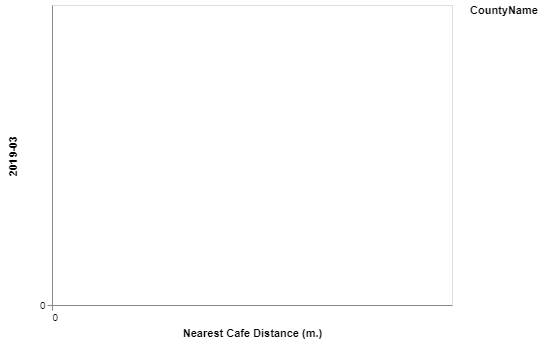

In [139]:
#Below chart is not seeming to work, but I tried running in Seaborn (see chunk below this chunk) and it works fine

# initialize the chart with the data
chart = alt.Chart(resultsRentCafe)

# define what kind of marks to use
chart = chart.mark_circle(size=60)

# encode the visual channels
chart = chart.encode(
    x='Nearest Cafe Distance (m.)',
    y='2019-03',
    color='CountyName',
    tooltip=["Nearest Cafe Distance (m.)", "2019-03", 'CountyName']
)

# make the chart interactive
chart.interactive()

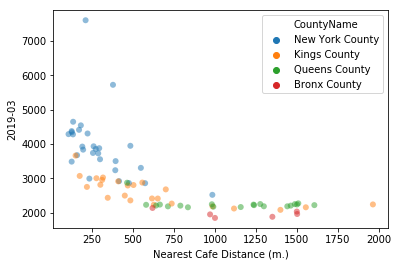

In [142]:
#Below chart demonstrates relationship cafe distance and March 2019 rents

style = dict(edgecolor='none', alpha=0.5)

# use the scatterplot() function
sns.scatterplot(x='Nearest Cafe Distance (m.)', y='2019-03', 
                 hue='CountyName', data=resultsRentCafe, **style) 

In [143]:
resultsWalkCafe = pd.merge(cafeDistance, walkscore, left_on ="Neighborhood", right_on="Name")
resultsWalkCafe.head(50)

,Neighborhood,County,Nearest Cafe Distance (m.),Rank,Name,Walk Score,Transit Score,Bike Score,Population
0,South Bronx,Bronx County,1499,64,South Bronx,95,95,73,"74,207"
1,Morris Park,Bronx County,1350,119,Morris Park,88,77,64,"16,410"
2,Kingsbridge,Bronx County,1000,88,Kingsbridge,92,93,61,"50,354"
3,City Island,Bronx County,619,201,City Island,68,37,48,"4,307"
4,East New York,Kings County,1963,127,East New York,86,88,66,"142,173"
5,Williamsburg,Kings County,503,44,Williamsburg,96,89,82,"138,526"
6,Flatbush,Kings County,985,71,Flatbush,94,92,75,"167,618"
7,Crown Heights,Kings County,651,59,Crown Heights,95,98,82,"125,818"
8,Bushwick,Kings County,346,66,Bushwick,95,90,82,"113,629"
9,Sunset Park,Kings County,627,63,Sunset Park,95,82,73,"100,989"


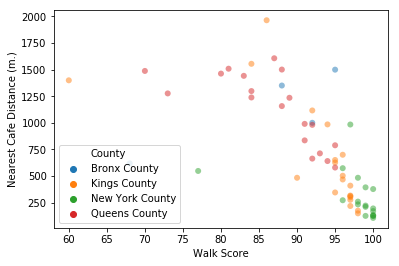

In [147]:
#Below chart demonstrates relationship between cafe distance and Walkscore

style = dict(edgecolor='none', alpha=0.5)

# use the scatterplot() function
sns.scatterplot(x='Walk Score', y='Nearest Cafe Distance (m.)', 
                 hue='County', data=resultsWalkCafe, **style) 

In [ ]:
#next step, assuming the above function loop works:
# 1. generate scatterplot comparing average distance to the average neighborhood rent, also for Walkscore vs average distance
# 2. 3rd nearest cafe distance? [density]
# 3. top-rated cafes, fitness studios

#expectations for Github page/posting?

#question regarding above loop function: consider locations across all NYC, not just in particular neighborhood?


In [ ]:
#bare minimum: average count of amenities per neighborhood, ideal would be to have a case study on a more granular area such as BK. 


# can we do fewer nodes for distance, stitch across the neighborhoods (maybe stick to NY and Queens)
# take the average distance to certain amenities within each of hte neighborhoods
# compare average distance to looping 

#main table: 3-4 amenities, main method: geographic access, 
# why is this analysis better? because it's based on how people live and interact/see cities
#"this amenity score is a better predictor for quality of life, ratehr than walkscore measure" -- why does this spatial configuratoin matter? 
# how does one think about planning (traffic, congestion)
#figure out what is the main thing to dig deeper into 


#next steps:
# 1) set up function to run for each individual NYC neighborhood
# 2) finalize Github repository
# 3) run amenitization for Williamsburg, UES
# 4) Zillow folder

# Yelp data not include NYC, but could use for another city (Las Vegas, Phoenix, Charlotte, Pittsburg, Cleveland)

In [4]:
#download packages
import numpy as np
import pandas as pd
import geopandas as gpd
import pandana as pnda
from pandana.loaders import osm
import osmnx as ox
import altair as alt
from shapely.geometry import Point
alt.renderers.enable('notebook')
%matplotlib inline

In [3]:
#read shpfile of zillow NY neighborhoods
zillowSHP = gpd.read_file("zillowdata/ZillowNeighborhoods-NY.shp")

In [4]:
williamsburg = zillowSHP['Name'].isin(['Chelsea'])
zillowWilliamsburg = zillowSHP.loc[williamsburg]
zillowWilliamsburg.head(10)

,State,County,City,Name,RegionID,geometry
434,NY,New York,New York,Chelsea,276254,POLYGON ((-74.00543670099995 40.75728355000007...


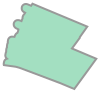

In [5]:
boundaryWilly = zillowWilliamsburg.geometry.unary_union
boundaryWilly

In [6]:
boundaryWilly = boundaryWilly.bounds
boundaryWilly

(-74.01304120999993,
 40.737739099000066,
 -73.99140999999992,
 40.757659904000036)

In [7]:
[lng_min, lat_min, lng_max, lat_max] = boundaryWilly

In [8]:
poi_dfWilly = osm.node_query(lat_min, lng_min, lat_max, lng_max)
poi_dfWilly = poi_dfWilly.dropna(subset=['amenity'])

In [9]:
net = osm.pdna_network_from_bbox(lat_min, lng_min, lat_max, lng_max, 
                                 network_type='walk')

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.73773910,-74.01304121,40.75765990,-73.99141000);>;);out;'}"
Downloaded 514.3KB from www.overpass-api.de in 2.66 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.68 seconds
Returning OSM data with 2,421 nodes and 727 ways...
Edge node pairs completed. Took 4.36 seconds
Returning processed graph with 902 nodes and 1,403 edges...
Completed OSM data download and Pandana node and edge table creation in 7.39 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


In [10]:
# sensible defaults
max_distance = 2000 # in meters
num_pois = 10 # only need the 10 nearest POI to each point in the network

amenities = ['restaurant', 'bar', 'cafe', 'car_sharing']
for amenity in amenities:
    
    # get the subset of amenities for this type
    pois_subset = poi_dfWilly[poi_dfWilly['amenity']==amenity]
    
    # set the POI, using the longitude and latitude of POI
    net.set_pois(amenity, max_distance, num_pois, 
                 pois_subset['lon'], pois_subset['lat'])

C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


In [11]:
amenity = 'cafe'
access = net.nearest_pois(distance=2000, category=amenity, 
                          num_pois=num_pois)

In [12]:
def to_geopandas(df, xcol='x', ycol='y'):
    """
    Utility function to convert from DataFrame to GeoDataFrame
    """
    df['geometry'] = df.apply(lambda row: Point(row[xcol], row[ycol]), axis=1)
    return gpd.GeoDataFrame(df, geometry='geometry', crs={'init':'epsg:4326'})

In [13]:
nodes = pd.merge(net.nodes_df, access, left_index=True, right_index=True)    
nodes = to_geopandas(nodes)

In [14]:
def plot_walking_distance(net, amenity, distance=3000, n=1):

    # subset of POI
    poi_subset = poi_dfWilly[poi_dfWilly['amenity']==amenity]
    
    # get the distances to nearest num_pois POI
    access = net.nearest_pois(distance=3000, category=amenity, num_pois=num_pois)

    # merge node positions and distances to nearest PO
    nodes = pd.merge(net.nodes_df, access, left_index=True, right_index=True)    
    nodes = to_geopandas(nodes)
    
    # plot the distance to the nth nearest amenity
    ax = nodes.plot(column=nodes[n], legend=True, **plot_kwargs)
    
    # add the amenities as stars
    for i, row in poi_subset.iterrows():
        ax.scatter(row['lon'], row['lat'], color='red', s=100, marker='*')
    
    # format
    ax.set_facecolor('black')
    ax.figure.set_size_inches(fig_kwargs['figsize'])
    
    # set extent
    [xmin, ymin, xmax, ymax] = nodes.geometry.total_bounds
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    
    return ax

In [15]:
#NEW FROM VICKY

#calculates mean distance for the 1st closest bar for data fram access defined above

access_valid = access[access[1]<9999]
access_valid[1].mean()

223.9313330105826

### 

In [51]:
# trying to define a function that loops over each neighborhood in NYC and calculates the mean distance to a given 
# amenity type and adds the neighborhood name and mean to a dataframe which we can print out at the end.

# Some errors / questions for Nick - 
### doesn't work if there isn't that type of amenity in one of the neighborhoods
### how to think about doing this for more than one amenity at a time
### what does max distance mean? / currently filtering it out

def getMeanAccess(zillowSHP, amenities):
    
    meandf = []
    NYCzillowSHP = zillowSHP[zillowSHP["County"].isin(["Queens","Manhattan", "Kings", "Bronx"])]
    neighborhoodlist = NYCzillowSHP["Name"].tolist()
    
    for hood_name in neighborhoodlist:
        hood = zillowSHP['Name'].isin([hood_name])
        zillowhood = zillowSHP.loc[hood]
        boundaryhood = zillowhood.geometry.unary_union
        hoodbounds = boundaryhood.bounds
        [lng_min, lat_min, lng_max, lat_max] = hoodbounds
        poi_dfhood = osm.node_query(lat_min, lng_min, lat_max, lng_max)
        poi_dfhood = poi_dfhood.dropna(subset=['amenity'])
        
        time.sleep(5)
        net = osm.pdna_network_from_bbox(lat_min, lng_min, lat_max, lng_max, 
                                 network_type='walk')
        max_distance = 50000 # in meters
        num_pois = 10 # only need the 10 nearest POI to each point in the network
        
        for amenity in amenities:
    
            # get the subset of amenities for this type
            pois_subset = poi_dfhood[poi_dfhood['amenity']==amenity]
            
            if pois_subset.shape[0]>0:
            
                # set the POI, using the longitude and latitude of POI
                net.set_pois(amenity, max_distance, num_pois, pois_subset['lon'], pois_subset['lat'])
        
                access = net.nearest_pois(distance=50000, category=amenity, num_pois=num_pois)
                access_valid = access[access[1]<99999]
                meandf.append({'Neighborhood' : hood_name, 'Amenity' : amenity, 'Mean Distance' : access_valid[1].mean()})
    
    pd.DataFrame(meandf)

In [52]:
getMeanAccess(zillowSHP, amenities)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.70743508,-73.87160325,40.73677728,-73.85169290);>;);out;'}"
Downloaded 583.1KB from www.overpass-api.de in 13.97 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 13.98 seconds
Returning OSM data with 2,834 nodes and 939 ways...
Edge node pairs completed. Took 1.21 seconds
Returning processed graph with 1,135 nodes and 1,656 edges...
Completed OSM data download and Pandana node and edge table creation in 15.30 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56807553,-73.86181072,40.58291220,-73.84493611);>;);out;'}"
Downloaded 54.0KB from www.overpass-api.de in 13.25 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 13.26 seconds
Returning OSM data with 235 nodes and 57 ways...
Edge node pairs completed. Took 0.14 seconds
Returning processed graph with 116 nodes and 200 edges...
Completed OSM data download and Pandana node and edge table creation in 13.47 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.64337968,-73.86317100,40.67165465,-73.82614171);>;);out;'}"
Downloaded 0.7KB from www.overpass-api.de in 15.28 seconds
Server at www.overpass-api.de returned status code 504 and no JSON data. Re-trying request in 0.00 seconds.
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.64337968,-73.86317100,40.67165465,-73.82614171);>;);out;'}"
Downloaded 615.3KB from www.overpass-api.de in 1.91 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 17.46 seconds
Returning OSM d

C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.54082268,-73.94151832,40.56590332,-73.90919683);>;);out;'}"
Downloaded 0.7KB from www.overpass-api.de in 15.35 seconds
Server at www.overpass-api.de returned status code 504 and no JSON data. Re-trying request in 0.00 seconds.
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.54082268,-73.94151832,40.56590332,-73.90919683);>;);out;'}"
Downloaded 145.6KB from www.overpass-api.de in 0.83 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 16.44 seconds
Returning OSM d

C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56592970,-73.86721042,40.57766370,-73.85627599);>;);out;'}"
Downloaded 75.0KB from www.overpass-api.de in 0.75 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.76 seconds
Returning OSM data with 460 nodes and 60 ways...
Edge node pairs completed. Took 0.11 seconds
Returning processed graph with 87 nodes and 141 edges...
Completed OSM data download and Pandana node and edge table creation in 0.95 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.75417472,-73.90353109,40.77216042,-73.85140048);>;);out;'}"
Downloaded 1,036.8KB from www.overpass-api.de in 6.90 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 6.93 seconds
Returning OSM data with 5,694 nodes and 1,543 ways...
Edge node pairs completed. Took 2.12 seconds
Returning processed graph with 1,944 nodes and 2,929 edges...
Completed OSM data download and Pandana node and edge table creation in 9.20 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.83639276,-73.88608412,40.84908657,-73.87167597);>;);out;'}"
Downloaded 196.6KB from www.overpass-api.de in 1.25 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.25 seconds
Returning OSM data with 1,316 nodes and 189 ways...
Edge node pairs completed. Took 0.47 seconds
Returning processed graph with 258 nodes and 389 edges...
Completed OSM data download and Pandana node and edge table creation in 1.81 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.68346863,-73.74488746,40.70126000,-73.72536800);>;);out;'}"
Downloaded 192.2KB from www.overpass-api.de in 1.34 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.35 seconds
Returning OSM data with 1,072 nodes and 228 ways...
Edge node pairs completed. Took 0.55 seconds
Returning processed graph with 419 nodes and 682 edges...
Completed OSM data download and Pandana node and edge table creation in 1.98 seconds
Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|const

C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.71220036,-73.92918671,40.74593275,-73.88492640);>;);out;'}"
Downloaded 1,224.8KB from www.overpass-api.de in 2.23 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.26 seconds
Returning OSM data with 5,791 nodes and 1,957 ways...
Edge node pairs completed. Took 2.56 seconds
Returning processed graph with 2,374 nodes and 3,535 edges...
Completed OSM data download and Pandana node and edge table creation in 4.97 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.60172381,-74.04277732,40.62574175,-74.01787572);>;);out;'}"
Downloaded 340.9KB from www.overpass-api.de in 1.25 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.26 seconds
Returning OSM data with 2,067 nodes and 492 ways...
Edge node pairs completed. Took 0.70 seconds
Returning processed graph with 636 nodes and 936 edges...
Completed OSM data download and Pandana node and edge table creation in 2.06 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.58159759,-73.79015232,40.62151232,-73.73718500);>;);out;'}"
Downloaded 799.7KB from www.overpass-api.de in 7.78 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 7.80 seconds
Returning OSM data with 4,280 nodes and 1,150 ways...
Edge node pairs completed. Took 1.61 seconds
Returning processed graph with 1,411 nodes and 2,006 edges...
Completed OSM data download and Pandana node and edge table creation in 9.54 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.69638358,-73.77736172,40.72115287,-73.74866981);>;);out;'}"
Downloaded 0.7KB from www.overpass-api.de in 15.16 seconds
Server at www.overpass-api.de returned status code 429 and no JSON data. Re-trying request in 5.00 seconds.
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.69638358,-73.77736172,40.72115287,-73.74866981);>;);out;'}"
Downloaded 461.2KB from www.overpass-api.de in 2.99 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 23.43 seconds
Returning OSM d

C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.67176316,-73.81726921,40.71517869,-73.77015574);>;);out;'}"
Downloaded 2,007.7KB from www.overpass-api.de in 1.52 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.55 seconds
Returning OSM data with 9,866 nodes and 2,988 ways...
Edge node pairs completed. Took 4.34 seconds
Returning processed graph with 3,950 nodes and 6,131 edges...
Completed OSM data download and Pandana node and edge table creation in 6.10 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.66251604,-73.83428163,40.69182459,-73.78795698);>;);out;'}"
Downloaded 891.0KB from www.overpass-api.de in 1.69 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.70 seconds
Returning OSM data with 4,840 nodes and 1,269 ways...
Edge node pairs completed. Took 2.10 seconds
Returning processed graph with 1,884 nodes and 2,993 edges...
Completed OSM data download and Pandana node and edge table creation in 3.94 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.74352015,-73.79584637,40.77953851,-73.74394407);>;);out;'}"
Downloaded 1,177.5KB from www.overpass-api.de in 2.63 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.65 seconds
Returning OSM data with 5,880 nodes and 1,615 ways...
Edge node pairs completed. Took 2.46 seconds
Returning processed graph with 2,320 nodes and 3,580 edges...
Completed OSM data download and Pandana node and edge table creation in 5.27 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.76408168,-73.88978521,40.78673174,-73.85049869);>;);out;'}"
Downloaded 649.3KB from www.overpass-api.de in 14.35 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 14.37 seconds
Returning OSM data with 4,187 nodes and 952 ways...
Edge node pairs completed. Took 1.08 seconds
Returning processed graph with 975 nodes and 1,346 edges...
Completed OSM data download and Pandana node and edge table creation in 15.58 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.68325099,-73.86880057,40.69840599,-73.84427154);>;);out;'}"
Downloaded 363.2KB from www.overpass-api.de in 1.21 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.23 seconds
Returning OSM data with 1,642 nodes and 503 ways...
Edge node pairs completed. Took 0.68 seconds
Returning processed graph with 565 nodes and 884 edges...
Completed OSM data download and Pandana node and edge table creation in 2.01 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.58357471,-73.80968674,40.60456632,-73.78520868);>;);out;'}"
Downloaded 263.7KB from www.overpass-api.de in 0.89 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.90 seconds
Returning OSM data with 1,651 nodes and 374 ways...
Edge node pairs completed. Took 0.56 seconds
Returning processed graph with 487 nodes and 734 edges...
Completed OSM data download and Pandana node and edge table creation in 1.54 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.59375969,-73.82871867,40.61959217,-73.81320048);>;);out;'}"
Downloaded 105.2KB from www.overpass-api.de in 1.04 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.04 seconds
Returning OSM data with 616 nodes and 124 ways...
Edge node pairs completed. Took 0.13 seconds
Returning processed graph with 142 nodes and 191 edges...
Completed OSM data download and Pandana node and edge table creation in 1.25 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.73842003,-73.83952692,40.77601068,-73.80271528);>;);out;'}"
Downloaded 1,240.1KB from www.overpass-api.de in 2.14 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.17 seconds
Returning OSM data with 6,902 nodes and 1,858 ways...
Edge node pairs completed. Took 2.85 seconds
Returning processed graph with 2,680 nodes and 4,182 edges...
Completed OSM data download and Pandana node and edge table creation in 5.19 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.72628837,-73.77152566,40.75336030,-73.73276698);>;);out;'}"
Downloaded 723.3KB from www.overpass-api.de in 1.69 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.70 seconds
Returning OSM data with 4,200 nodes and 899 ways...
Edge node pairs completed. Took 1.33 seconds
Returning processed graph with 1,283 nodes and 1,916 edges...
Completed OSM data download and Pandana node and edge table creation in 3.15 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.66402848,-73.86630508,40.69143000,-73.82470000);>;);out;'}"
Downloaded 1,035.8KB from www.overpass-api.de in 1.30 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.32 seconds
Returning OSM data with 5,039 nodes and 1,645 ways...
Edge node pairs completed. Took 2.46 seconds
Returning processed graph with 2,143 nodes and 3,338 edges...
Completed OSM data download and Pandana node and edge table creation in 3.93 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.55412299,-73.91082754,40.56644000,-73.88688723);>;);out;'}"
Downloaded 74.2KB from www.overpass-api.de in 5.85 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 5.85 seconds
Returning OSM data with 465 nodes and 110 ways...
Edge node pairs completed. Took 0.15 seconds
Returning processed graph with 128 nodes and 175 edges...
Completed OSM data download and Pandana node and edge table creation in 6.09 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.78663990,-73.83297225,40.79796508,-73.82347379);>;);out;'}"
Downloaded 75.1KB from www.overpass-api.de in 1.10 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.10 seconds
Returning OSM data with 481 nodes and 70 ways...
Edge node pairs completed. Took 0.10 seconds
Returning processed graph with 83 nodes and 115 edges...
Completed OSM data download and Pandana node and edge table creation in 1.28 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.70402138,-73.82725420,40.71997704,-73.80279147);>;);out;'}"
Downloaded 413.5KB from www.overpass-api.de in 1.73 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.74 seconds
Returning OSM data with 2,017 nodes and 556 ways...
Edge node pairs completed. Took 0.70 seconds
Returning processed graph with 651 nodes and 930 edges...
Completed OSM data download and Pandana node and edge table creation in 2.54 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.76454279,-73.86014032,40.79795725,-73.82454309);>;);out;'}"
Downloaded 618.6KB from www.overpass-api.de in 1.72 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.73 seconds
Returning OSM data with 3,673 nodes and 982 ways...
Edge node pairs completed. Took 1.49 seconds
Returning processed graph with 1,399 nodes and 2,080 edges...
Completed OSM data download and Pandana node and edge table creation in 3.34 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.73405989,-73.87369700,40.75836674,-73.84721176);>;);out;'}"
Downloaded 661.7KB from www.overpass-api.de in 6.51 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 6.53 seconds
Returning OSM data with 3,489 nodes and 981 ways...
Edge node pairs completed. Took 1.42 seconds
Returning processed graph with 1,270 nodes and 1,940 edges...
Completed OSM data download and Pandana node and edge table creation in 8.06 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.72717584,-73.81116640,40.73867126,-73.80462065);>;);out;'}"
Downloaded 135.1KB from www.overpass-api.de in 6.45 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 6.46 seconds
Returning OSM data with 816 nodes and 195 ways...
Edge node pairs completed. Took 0.28 seconds
Returning processed graph with 249 nodes and 356 edges...
Completed OSM data download and Pandana node and edge table creation in 6.83 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.71071000,-73.79363315,40.72921216,-73.77360000);>;);out;'}"
Downloaded 337.3KB from www.overpass-api.de in 1.80 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.81 seconds
Returning OSM data with 1,808 nodes and 426 ways...
Edge node pairs completed. Took 0.62 seconds
Returning processed graph with 547 nodes and 830 edges...
Completed OSM data download and Pandana node and edge table creation in 2.53 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.57240397,-73.85093777,40.58841025,-73.81737618);>;);out;'}"
Downloaded 212.8KB from www.overpass-api.de in 0.86 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.87 seconds
Returning OSM data with 1,148 nodes and 283 ways...
Edge node pairs completed. Took 0.41 seconds
Returning processed graph with 370 nodes and 565 edges...
Completed OSM data download and Pandana node and edge table creation in 1.38 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56435000,-73.89658190,40.56932982,-73.88568513);>;);out;'}"
Downloaded 36.6KB from www.overpass-api.de in 0.71 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.71 seconds
Returning OSM data with 208 nodes and 64 ways...
Edge node pairs completed. Took 0.08 seconds
Returning processed graph with 76 nodes and 106 edges...
Completed OSM data download and Pandana node and edge table creation in 0.87 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.58115889,-73.82157192,40.59448762,-73.80506948);>;);out;'}"
Downloaded 197.5KB from www.overpass-api.de in 1.22 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.23 seconds
Returning OSM data with 1,209 nodes and 278 ways...
Edge node pairs completed. Took 0.38 seconds
Returning processed graph with 348 nodes and 516 edges...
Completed OSM data download and Pandana node and edge table creation in 1.71 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.74088000,-73.73273199,40.75993543,-73.70173349);>;);out;'}"
Downloaded 543.3KB from www.overpass-api.de in 1.48 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.50 seconds
Returning OSM data with 3,481 nodes and 725 ways...
Edge node pairs completed. Took 1.11 seconds
Returning processed graph with 1,029 nodes and 1,530 edges...
Completed OSM data download and Pandana node and edge table creation in 2.73 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.71729717,-73.83714318,40.74338000,-73.80908952);>;);out;'}"
Downloaded 658.1KB from www.overpass-api.de in 3.14 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.16 seconds
Returning OSM data with 3,655 nodes and 973 ways...
Edge node pairs completed. Took 1.31 seconds
Returning processed graph with 1,200 nodes and 1,776 edges...
Completed OSM data download and Pandana node and edge table creation in 4.59 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.59674000,-74.00177647,40.62774500,-73.97205021);>;);out;'}"
Downloaded 434.0KB from www.overpass-api.de in 3.36 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.38 seconds
Returning OSM data with 2,312 nodes and 562 ways...
Edge node pairs completed. Took 1.12 seconds
Returning processed graph with 1,030 nodes and 1,687 edges...
Completed OSM data download and Pandana node and edge table creation in 4.60 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.57879091,-74.01922319,40.61266461,-73.98259207);>;);out;'}"
Downloaded 562.3KB from www.overpass-api.de in 2.02 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.04 seconds
Returning OSM data with 3,212 nodes and 882 ways...
Edge node pairs completed. Took 1.49 seconds
Returning processed graph with 1,372 nodes and 2,123 edges...
Completed OSM data download and Pandana node and edge table creation in 3.64 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.61972122,-74.04256468,40.64167207,-74.01589074);>;);out;'}"
Downloaded 362.4KB from www.overpass-api.de in 6.53 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 6.53 seconds
Returning OSM data with 1,974 nodes and 500 ways...
Edge node pairs completed. Took 0.75 seconds
Returning processed graph with 663 nodes and 1,039 edges...
Completed OSM data download and Pandana node and edge table creation in 7.39 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.80359568,-73.87102742,40.81580319,-73.84667868);>;);out;'}"
Downloaded 191.7KB from www.overpass-api.de in 2.04 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.05 seconds
Returning OSM data with 1,309 nodes and 182 ways...
Edge node pairs completed. Took 0.28 seconds
Returning processed graph with 261 nodes and 381 edges...
Completed OSM data download and Pandana node and edge table creation in 2.43 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.63075393,-73.94716220,40.66641586,-73.90753209);>;);out;'}"
Downloaded 850.4KB from www.overpass-api.de in 3.93 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 3.96 seconds
Returning OSM data with 3,821 nodes and 1,564 ways...
Edge node pairs completed. Took 2.25 seconds
Returning processed graph with 1,910 nodes and 3,024 edges...
Completed OSM data download and Pandana node and edge table creation in 6.34 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.60449296,-73.91031000,40.62373121,-73.88856468);>;);out;'}"
Downloaded 135.1KB from www.overpass-api.de in 2.87 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.87 seconds
Returning OSM data with 1,057 nodes and 136 ways...
Edge node pairs completed. Took 0.25 seconds
Returning processed graph with 214 nodes and 334 edges...
Completed OSM data download and Pandana node and edge table creation in 3.20 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.62189789,-74.01025368,40.64684489,-73.97815000);>;);out;'}"
Downloaded 354.4KB from www.overpass-api.de in 1.43 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.44 seconds
Returning OSM data with 1,856 nodes and 451 ways...
Edge node pairs completed. Took 0.93 seconds
Returning processed graph with 832 nodes and 1,374 edges...
Completed OSM data download and Pandana node and edge table creation in 2.46 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.57215857,-73.96961779,40.58480294,-73.95284373);>;);out;'}"
Downloaded 232.1KB from www.overpass-api.de in 1.09 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.09 seconds
Returning OSM data with 1,129 nodes and 345 ways...
Edge node pairs completed. Took 0.49 seconds
Returning processed graph with 413 nodes and 601 edges...
Completed OSM data download and Pandana node and edge table creation in 1.66 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.65120138,-73.92434581,40.67538009,-73.89960382);>;);out;'}"
Downloaded 426.8KB from www.overpass-api.de in 1.42 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.43 seconds
Returning OSM data with 1,894 nodes and 674 ways...
Edge node pairs completed. Took 1.21 seconds
Returning processed graph with 811 nodes and 1,324 edges...
Completed OSM data download and Pandana node and edge table creation in 2.75 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.62155919,-73.91976753,40.65744996,-73.87626268);>;);out;'}"
Downloaded 1,014.1KB from www.overpass-api.de in 1.26 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.28 seconds
Returning OSM data with 5,634 nodes and 1,679 ways...
Edge node pairs completed. Took 3.21 seconds
Returning processed graph with 2,188 nodes and 3,357 edges...
Completed OSM data download and Pandana node and edge table creation in 4.64 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.63523468,-73.90434505,40.69515000,-73.85566000);>;);out;'}"
Downloaded 1,935.4KB from www.overpass-api.de in 1.82 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.85 seconds
Returning OSM data with 11,185 nodes and 3,061 ways...
Edge node pairs completed. Took 6.38 seconds
Returning processed graph with 4,353 nodes and 6,885 edges...
Completed OSM data download and Pandana node and edge table creation in 8.49 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.60642782,-74.02480000,40.63447878,-73.99913147);>;);out;'}"
Downloaded 357.1KB from www.overpass-api.de in 1.69 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.70 seconds
Returning OSM data with 2,016 nodes and 475 ways...
Edge node pairs completed. Took 1.12 seconds
Returning processed graph with 869 nodes and 1,409 edges...
Completed OSM data download and Pandana node and edge table creation in 2.91 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.56994268,-74.01394063,40.58377287,-73.96682827);>;);out;'}"
Downloaded 457.5KB from www.overpass-api.de in 1.78 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.78 seconds
Returning OSM data with 2,459 nodes and 796 ways...
Edge node pairs completed. Took 1.42 seconds
Returning processed graph with 996 nodes and 1,449 edges...
Completed OSM data download and Pandana node and edge table creation in 3.31 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.62865655,-73.97210639,40.65562735,-73.94451410);>;);out;'}"
Downloaded 534.3KB from www.overpass-api.de in 2.22 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.23 seconds
Returning OSM data with 2,533 nodes and 839 ways...
Edge node pairs completed. Took 1.45 seconds
Returning processed graph with 987 nodes and 1,544 edges...
Completed OSM data download and Pandana node and edge table creation in 3.79 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.57334373,-73.95506000,40.58284965,-73.93024068);>;);out;'}"
Downloaded 125.9KB from www.overpass-api.de in 0.57 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 0.58 seconds
Returning OSM data with 804 nodes and 207 ways...
Edge node pairs completed. Took 0.40 seconds
Returning processed graph with 290 nodes and 418 edges...
Completed OSM data download and Pandana node and edge table creation in 1.05 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.65743696,-73.99294146,40.68481412,-73.96949604);>;);out;'}"
Downloaded 638.6KB from www.overpass-api.de in 2.86 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.87 seconds
Returning OSM data with 3,663 nodes and 834 ways...
Edge node pairs completed. Took 1.55 seconds
Returning processed graph with 1,054 nodes and 1,665 edges...
Completed OSM data download and Pandana node and edge table creation in 4.55 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  distances, indexes = self.kdtree.query(xys.as_matrix())


Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.83841668,-73.87310851,40.85223500,-73.85525337);>;);out;'}"
Downloaded 170.3KB from www.overpass-api.de in 1.58 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.58 seconds
Returning OSM data with 1,018 nodes and 234 ways...
Edge node pairs completed. Took 0.38 seconds
Returning processed graph with 302 nodes and 439 edges...
Completed OSM data download and Pandana node and edge table creation in 2.04 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.73543832,-73.91753195,40.76578550,-73.89462000);>;);out;'}"
Downloaded 903.2KB from www.overpass-api.de in 1.74 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.75 seconds
Returning OSM data with 4,115 nodes and 1,646 ways...
Edge node pairs completed. Took 3.32 seconds
Returning processed graph with 2,108 nodes and 3,480 edges...
Completed OSM data download and Pandana node and edge table creation in 5.21 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.67893687,-73.94132932,40.70885520,-73.89649700);>;);out;'}"
Downloaded 751.9KB from www.overpass-api.de in 2.68 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.71 seconds
Returning OSM data with 3,783 nodes and 1,128 ways...
Edge node pairs completed. Took 1.80 seconds
Returning processed graph with 1,558 nodes and 2,578 edges...
Completed OSM data download and Pandana node and edge table creation in 4.64 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.84038851,-73.90266224,40.85624594,-73.88235539);>;);out;'}"
Downloaded 332.8KB from www.overpass-api.de in 2.15 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.16 seconds
Returning OSM data with 1,996 nodes and 438 ways...
Edge node pairs completed. Took 0.70 seconds
Returning processed graph with 658 nodes and 1,014 edges...
Completed OSM data download and Pandana node and edge table creation in 2.97 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.70543142,-73.89451953,40.73171839,-73.85940515);>;);out;'}"
Downloaded 794.9KB from www.overpass-api.de in 1.94 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.96 seconds
Returning OSM data with 4,011 nodes and 1,270 ways...
Edge node pairs completed. Took 1.77 seconds
Returning processed graph with 1,658 nodes and 2,461 edges...
Completed OSM data download and Pandana node and edge table creation in 3.86 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.74594739,-73.98473008,40.77682000,-73.78688982);>;);out;'}"
Downloaded 6,950.6KB from www.overpass-api.de in 3.85 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 4.03 seconds
Returning OSM data with 37,604 nodes and 10,937 ways...
Edge node pairs completed. Took 17.51 seconds
Returning processed graph with 14,878 nodes and 24,065 edges...
Completed OSM data download and Pandana node and edge table creation in 22.31 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.60587631,-74.01157948,40.62437266,-73.99776987);>;);out;'}"
Downloaded 126.1KB from www.overpass-api.de in 1.29 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.30 seconds
Returning OSM data with 782 nodes and 128 ways...
Edge node pairs completed. Took 0.37 seconds
Returning processed graph with 347 nodes and 592 edges...
Completed OSM data download and Pandana node and edge table creation in 1.73 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.79574768,-73.93354662,40.81144500,-73.90188946);>;);out;'}"
Downloaded 408.3KB from www.overpass-api.de in 1.40 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.40 seconds
Returning OSM data with 2,446 nodes and 545 ways...
Edge node pairs completed. Took 0.77 seconds
Returning processed graph with 668 nodes and 965 edges...
Completed OSM data download and Pandana node and edge table creation in 2.28 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.66377496,-74.02085832,40.68702148,-73.99845714);>;);out;'}"
Downloaded 277.3KB from www.overpass-api.de in 1.02 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.03 seconds
Returning OSM data with 1,413 nodes and 450 ways...
Edge node pairs completed. Took 0.66 seconds
Returning processed graph with 527 nodes and 805 edges...
Completed OSM data download and Pandana node and edge table creation in 1.78 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.69766034,-73.97561082,40.72777877,-73.92072600);>;);out;'}"
Downloaded 1,308.6KB from www.overpass-api.de in 2.37 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.39 seconds
Returning OSM data with 6,556 nodes and 2,010 ways...
Edge node pairs completed. Took 3.11 seconds
Returning processed graph with 2,539 nodes and 4,023 edges...
Completed OSM data download and Pandana node and edge table creation in 5.67 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.73824000,-73.80460951,40.76350279,-73.77592247);>;);out;'}"
Downloaded 635.2KB from www.overpass-api.de in 1.81 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.84 seconds
Returning OSM data with 3,169 nodes and 832 ways...
Edge node pairs completed. Took 1.59 seconds
Returning processed graph with 1,161 nodes and 1,792 edges...
Completed OSM data download and Pandana node and edge table creation in 3.55 seconds


C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:82: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  nodes_df.astype('double').as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:83: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  edges.as_matrix(),
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:85: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  .astype('double')
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:91: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  self.kdtree = KDTree(nodes_df.as_matrix())
C:\Users\jibra\AppData\Local\conda\conda\envs\musa-620\lib\site-packages\pandana\network.py:371: FutureWarning: Method .as_ma

MemoryError: 

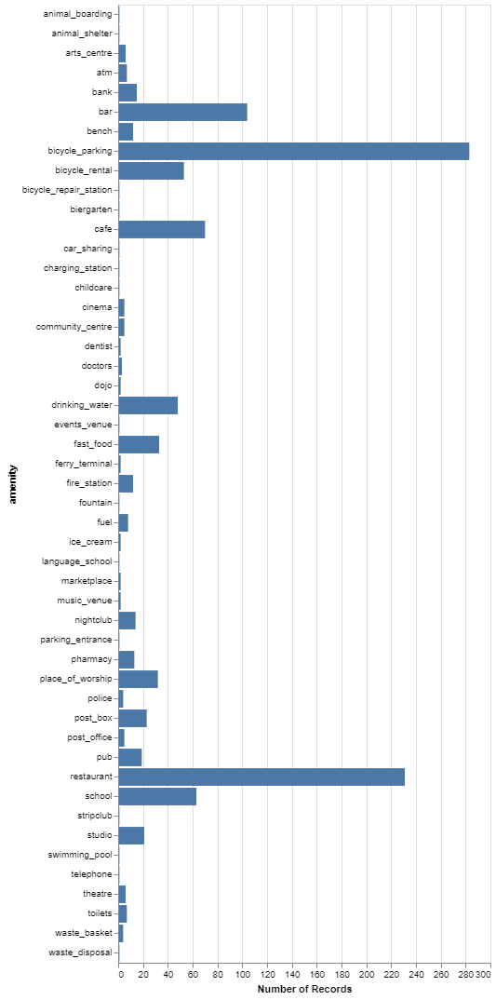

In [14]:
(alt.Chart(poi_dfWilly)
.mark_bar()
.encode(y='amenity', 
        x='count()', 
        tooltip=['amenity', 'count()']))

In [17]:
# keyword arguments to pass for the matplotlib figure
bbox_aspect_ratio = (lat_max - lat_min) / (lng_max - lng_min)
fig_kwargs = {'facecolor':'w', 
              'figsize':(10, 10 * bbox_aspect_ratio)}

# keyword arguments to pass for scatter plots
plot_kwargs = {'s':20, 
               'alpha':0.9, 
               'cmap':'viridis_r', 
               'edgecolor':'none'}